# Training and Visualizing a Decision Tree¶

In [18]:
######################################### Imports #########################################
from __future__ import division, print_function, unicode_literals
import numpy as np 
import scipy as sp 
import os
import matplotlib
import matplotlib.pyplot as plt 

####################################### Set up ###########################################
PROJECT_ROOT_DIR = "C:/Users/ivyzh/Desktop/ISOM 672 - Intro to BA/HW1"
CHAPTER_ID = "decision_trees_HW1"

# Define path of an image. The two function codes are from lecture note
# Function that takes as input fig_id and returns back the image path
def image_path(fig_id):
    return os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id)


# Save image in a specific path
# Function that takes as input fig_id and saves the image in a specific format (i.e., png, 300 dpi)
def save_fig(fig_id, tight_layout=True):
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(image_path(fig_id) + ".png", format='png', dpi=300)

In [69]:
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
from scipy import stats
import pandas as pd

# Import the data
df = pd.read_csv("C:\\Users\\ivyzh\\Desktop\\ISOM 672 - Intro to BA\\HW1\\HW1_Data.csv")

# We want to look through the basic statistics of the data, check if there is any error input
df.describe()


,revenue,outcalls,incalls,months,eqpdays,webcap,marryyes,travel,pcown,creditcd,retcalls,churndep
count,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000,31891.000000
mean,58.665179,24.951385,8.065277,18.761908,391.222633,0.894704,0.363175,0.057163,0.184817,0.676931,0.044088,0.497162
std,44.163859,34.790147,16.610589,9.548019,254.998478,0.306939,0.480922,0.232158,0.388155,0.467656,0.224552,0.500000
min,-5.860000,0.000000,0.000000,6.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,33.450000,3.000000,0.000000,11.000000,212.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,48.380000,13.330000,2.000000,17.000000,341.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,71.040000,33.330000,9.000000,24.000000,530.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,861.110000,610.330000,404.000000,60.000000,1812.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000


In [33]:
# We found some negative values in the data, so we apply the loop to skip all the negative values
for col in df.columns.tolist()[1:]:
    df = df.loc[df[col] > 0]

,revenue,outcalls,incalls,months,eqpdays,webcap,marryyes,travel,pcown,creditcd,retcalls,churndep
count,12.00000,12.000000,12.000000,12.000000,12.000000,12.0,12.0,12.0,12.0,12.0,12.0,12.0
mean,64.20250,45.027500,12.444167,19.500000,282.083333,1.0,1.0,1.0,1.0,1.0,1.0,1.0
std,35.88008,59.931486,13.808742,9.968131,203.370445,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,30.49000,1.330000,0.330000,11.000000,12.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
25%,38.41750,10.750000,2.332500,11.000000,135.250000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
50%,52.00000,22.500000,8.335000,17.000000,245.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
75%,80.17000,48.330000,15.252500,22.500000,452.250000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
max,150.55000,205.000000,40.000000,40.000000,586.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0


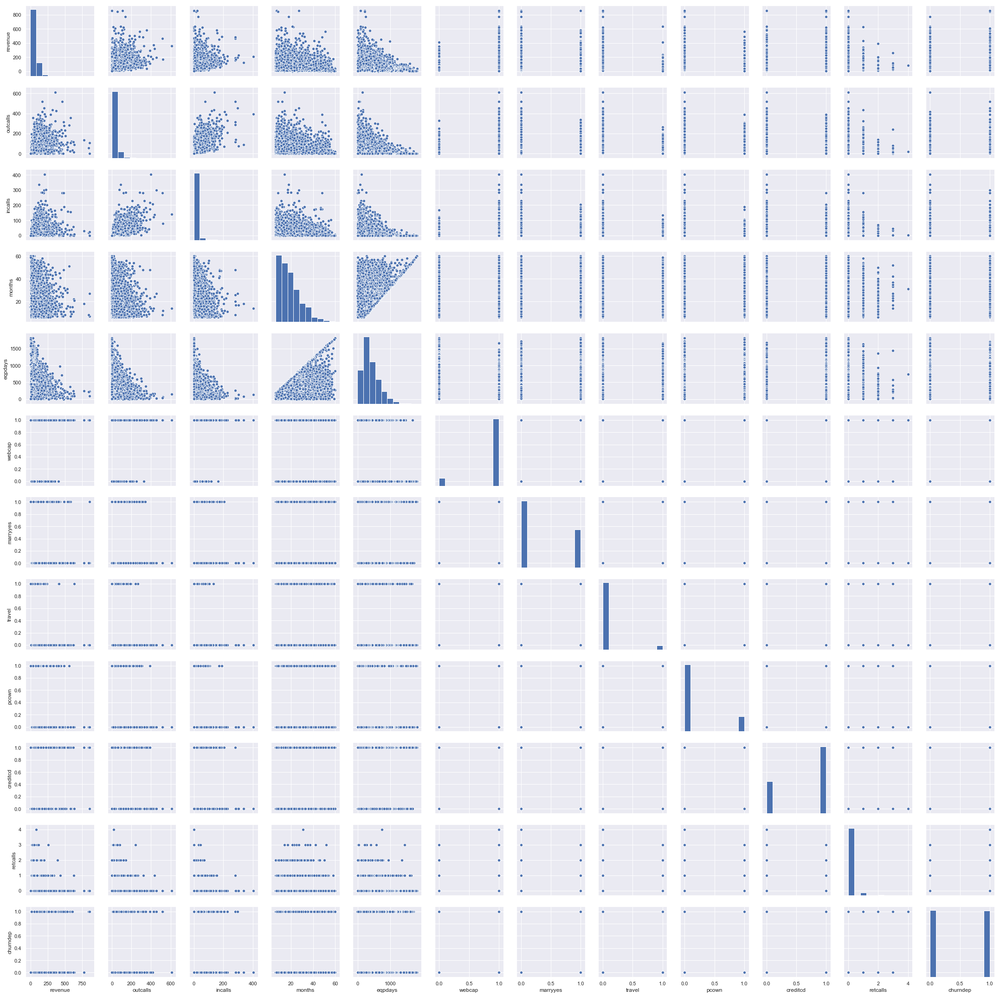

In [71]:
# Define X to be the churn data and y to be all the other attributes data
X = df.iloc[:, :11] 
y = df.iloc[:,-1]

sns.pairplot(df)

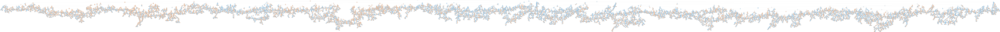

In [72]:
######################################### Imports #########################################
from sklearn.tree import export_graphviz
import graphviz
from IPython.display import Image
import os

# Build the decision tree and initialize the classifier
tree_clf = DecisionTreeClassifier(random_state=42, criterion = "entropy") 
tree_clf.fit(X, y)
# Export the result image to the path we set
export_graphviz(
        tree_clf,
        out_file=image_path("HW1_tree.dot"),
        rounded=True,
        filled=True
    )
path_png = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, "HW1_tree.png")
Image(path_png)

# Model Evaluation

In [77]:
######################################### Imports #########################################
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn import metrics

########################## Build Model & Apply it to the Test Set###########################

# Split the data into a training set and a test set, use 70% of the data as training data and 30% as test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=1)

# Initialize the classifier with max_depth at 4(we tried different numbers and found 4 gives the highest accuracy)
clf2 = tree.DecisionTreeClassifier(max_depth = 4)

# Predict using different classifier
# Predict by classifier using entrophy criterion
y_pred1 = tree_clf.fit(X_train, y_train).predict(X_test) 
# Predict by classifier using gini(the default criterion)
y_pred2 = clf2.fit(X_train, y_train).predict(X_test)

################################# Evaluation ################################################
# Print the corresponding statistics of prediction using different classifier
print("clf(Entrophy with no Max_depth) Report:\n",metrics.classification_report(y_test, y_pred1))
print("clf(Entrophy with no Max_depth) Accuracy: ", metrics.accuracy_score(y_test,y_pred1))

clf(Entrophy with no Max_depth) Report:
               precision    recall  f1-score   support

           0       0.53      0.55      0.54      4681
           1       0.55      0.54      0.55      4887

   micro avg       0.54      0.54      0.54      9568
   macro avg       0.54      0.54      0.54      9568
weighted avg       0.54      0.54      0.54      9568

clf(Entrophy with no Max_depth) Accuracy:  0.5431647157190636
clf2(Gini with Max_depth = 4) Report:
               precision    recall  f1-score   support

           0       0.63      0.44      0.52      4681
           1       0.58      0.75      0.66      4887

   micro avg       0.60      0.60      0.60      9568
   macro avg       0.61      0.60      0.59      9568
weighted avg       0.61      0.60      0.59      9568

clf2(Gini with Max_depth = 4) Accuracy:  0.5987667224080268


Confusion matrix, without normalization
[[2568 2113]
 [2258 2629]]


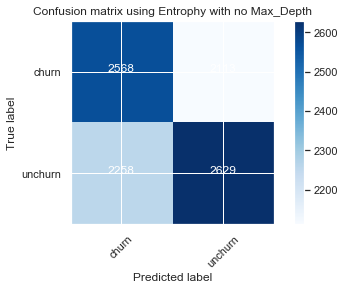

Confusion matrix, without normalization
[[2048 2633]
 [1206 3681]]


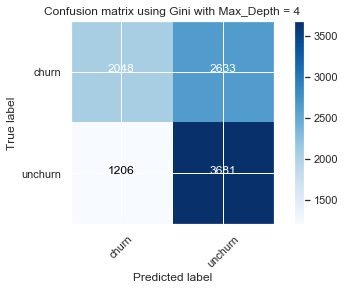

In [78]:
###################################### Confusion Matrix #####################################

# Build the function that prints and plots the confusion matrix. This part of code is from lecture note.
# Normalization can be applied by setting `normalize=True` 
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
        
# Compute confusion matrix to evaluate the accuracy of a classification    
cnf_matrix1 = confusion_matrix(y_test, y_pred1) 
np.set_printoptions(precision=2)
cnf_matrix2 = confusion_matrix(y_test, y_pred2) 
np.set_printoptions(precision=2)

# Plot the confusion matrix 
plt.figure()
plot_confusion_matrix(cnf_matrix1, classes= ["churn", "unchurn"],
                      title='Confusion matrix using Entrophy with no Max_Depth')# Give the matrix an input, and a title

plt.show()

clf2(Gini with Max_depth = 4) Report:
               precision    recall  f1-score   support

           0       0.63      0.44      0.52      4681
           1       0.58      0.75      0.66      4887

   micro avg       0.60      0.60      0.60      9568
   macro avg       0.61      0.60      0.59      9568
weighted avg       0.61      0.60      0.59      9568

clf2(Gini with Max_depth = 4) Accuracy:  0.5987667224080268
Confusion matrix, without normalization
[[2048 2633]
 [1206 3681]]


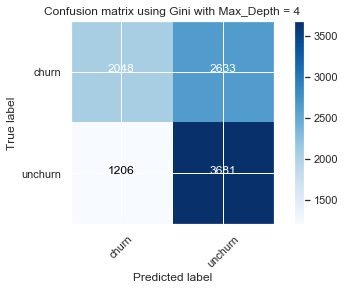

In [79]:
# Improve the model using different parameters
# Predict by classifier using gini(the default criterion)
y_pred2 = clf2.fit(X_train, y_train).predict(X_test)

################################# Evaluation ################################################
# Print the corresponding statistics of prediction 

print("clf2(Gini with Max_depth = 4) Report:\n",metrics.classification_report(y_test, y_pred2))
print("clf2(Gini with Max_depth = 4) Accuracy: ", metrics.accuracy_score(y_test,y_pred2))

# Print the confusion matrix
plot_confusion_matrix(cnf_matrix2, classes= ["churn", "unchurn"],
                      title='Confusion matrix using Gini with Max_Depth = 4')# Give the matrix an input, and a title


plt.show()